# Assignment 2

In this assignment you will create a coordinate-based multilayer perceptron in numpy from scratch. For each input image coordinate $(x,y)$, the model predicts the associated color $(r,g,b)$.

![Network diagram](https://user-images.githubusercontent.com/3310961/85066930-ad444580-b164-11ea-9cc0-17494679e71f.png)

You will then compare the following input feature mappings $\gamma (\mathbf{v})$.

- No mapping: $\gamma(\mathbf{v})= \mathbf{v}$. 

- Basic mapping: $\gamma(\mathbf{v})=\left[ \cos(2 \pi \mathbf{v}),\sin(2 \pi \mathbf{v}) \right]^\mathrm{T}$. 

- Gaussian Fourier feature mapping: $\gamma(\mathbf{v})= \left[ \cos(2 \pi \mathbf B \mathbf{v}), \sin(2 \pi \mathbf B \mathbf{v}) \right]^\mathrm{T}$, 
where each entry in $\mathbf B \in \mathbb R^{m \times d}$ is sampled from $\mathcal N(0,\sigma^2)$.

Some notes to help you with that:

- You will implement the mappings in the helper functions `get_B_dict` and `input_mapping`. 
- The basic mapping can be considered a case where $\mathbf B \in \mathbb R^{2 \times 2}$ is the indentity matrix. 
- For this assignment, $d$ is 2 because the input coordinates in two dimensions. 
- You can experiment with $m$ and $\sigma$ values e.g. $m=256$ and $\sigma \in \{1, 10, 100\}$.

Source: https://bmild.github.io/fourfeat/ 
This assignment is inspired by and built off of the authors' demo. 

## Setup

### (Optional) Colab Setup
If you aren't using Colab, you can delete the following code cell. Replace the path below with the path in your Google Drive to the uploaded assignment folder. Mounting to Google Drive will allow you access the other .py files in the assignment folder and save outputs to this folder

In [1]:
# you will be prompted with a window asking to grant permissions
# click connect to google drive, choose your account, and click allow
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
ls

drive/  sample_data/


In [3]:
cd drive/MyDrive/cs444hw2

/content/drive/MyDrive/cs444hw2


### Imports

In [4]:
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import os, imageio
import cv2
import numpy as np

# imports /content/assignment2/models/neural_net.py if you mounted correctly 
from models.neural_net import NeuralNetwork

# makes sure your NeuralNetwork updates as you make changes to the .py file
%load_ext autoreload
%autoreload 2

# sets default size of plots
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0)  

## Helper Functions

### Experiment Runner (Fill in TODOs)

In [5]:
from sklearn.utils import shuffle
from numpy import log10
def NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                  hidden_size, hidden_sizes, output_size, epochs,\
                  learning_rate, opt):
  
  # Initialize a new neural network model
  net = NeuralNetwork(input_size, hidden_sizes, output_size, num_layers, opt)

  # Variables to store performance for each epoch
  train_loss = np.zeros(epochs)
  train_psnr = np.zeros(epochs)
  test_psnr = np.zeros(epochs)

  # array to store the outut image
  predicted_images = np.zeros((epochs, y_test.shape[0], y_test.shape[1]))

  for epoch in tqdm(range(epochs)):
    
      # Shuffle the dataset
      X_train, y_train = shuffle(X_train, y_train, random_state=0)

      # ========== TRAINING ==========
      # Forward to get a prediction and record the psnr
      prediction = net.forward(X_train)  # our network already returns RGB values in rangle [0, 1]
      
      # Backward to compute the loss, record the loss, and update the weights
      train_loss[epoch] = net.backward(y_train)
      net.update(lr=learning_rate, opt=opt)

      m = np.mean((y_train - prediction) ** 2)
      train_psnr[epoch] = 20 * log10(1.0/np.sqrt(m)) if m > 1e-10 else 100

      # ========== Testing ==========
      prediction_test = net.forward(X_test) 
      
      m = np.mean((y_test - prediction_test) ** 2)
      test_psnr[epoch] = 20 * log10(1.0/np.sqrt(m)) if m > 1e-10 else 100

      predicted_images[epoch] = prediction_test
  # loop ends

  return net, train_psnr, test_psnr, train_loss, predicted_images

### Image Data and Feature Mappings (Fill in TODOs)

In [7]:
# Data loader - already done for you
def get_image(size=512, \
              image_url='https://bmild.github.io/fourfeat/img/lion_orig.png'):

  # Download image, take a square crop from the center  
  img = imageio.imread(image_url)[..., :3] / 255.
  c = [img.shape[0]//2, img.shape[1]//2]
  r = 256
  img = img[c[0]-r:c[0]+r, c[1]-r:c[1]+r]

  if size != 512:
    img = cv2.resize(img, (size, size))

  plt.imshow(img)
  plt.show()

  # Create input pixel coordinates in the unit square
  coords = np.linspace(0, 1, img.shape[0], endpoint=False)
  x_test = np.stack(np.meshgrid(coords, coords), -1)
  test_data = [x_test, img]
  train_data = [x_test[::2, ::2], img[::2, ::2]]

  return train_data, test_data

In [8]:
# Create the mappings dictionary of matrix B -  you will implement this
def get_B_dict():
  B_dict = {}
  B_dict['none'] = None
  B_dict['basic'] = np.eye(2)

  # add B matrix for basic, gauss_1.0, gauss_10.0, gauss_100.0
  # TODO implement this  
  for scale in [1., 10., 100.]:
    B = np.random.normal(0, scale,size=(256, 2))
    B_dict[f'gauss_{scale}'] = B

  return B_dict

In [9]:
# Given tensor x of input coordinates, map it using B - you will implement
def input_mapping(x, B):
  if B is None:
    # "none" mapping - just returns the original input coordinates
    return x
  else:
    # "basic" mapping and "gauss_X" mappings project input features using B
    # TODO implement 
    v = (2.0*np.pi*x) @ B.T
    return np.concatenate([np.sin(v), np.cos(v)], axis=-1)

In [10]:
# Apply the input feature mapping to the train and test data - already done for you
def get_input_features(B_dict, mapping):
  # mapping is the key to the B_dict, which has the value of B
  # B is then used with the function `input_mapping` to map x  
  y_train = train_data[1].reshape(-1, output_size)
  y_test = test_data[1].reshape(-1, output_size)
  X_train = input_mapping(train_data[0].reshape(-1, 2), B_dict[mapping])
  X_test = input_mapping(test_data[0].reshape(-1, 2), B_dict[mapping])
  return X_train, y_train, X_test, y_test

### MSE Loss and PSNR Error (Fill in TODOs)

In [54]:
def mse(y, p):
  # TODO implement this
  # make sure it is consistent with your implementation in neural_net.py
  return np.mean(np.square(y - p))/2.0

def psnr(y, p):
  # TODO implement this  
  p = 100
  m =  mse(y,p)
  if(m > 1e-10): p = 20*log10(1.0/np.sqrt(m))
  return p
    

### Plotting

In [12]:
def plot_training_curves(train_loss, train_psnr, test_psnr):
  # plot the training loss
  plt.subplot(2, 1, 1)
  plt.plot(train_loss)
  plt.title('MSE history')
  plt.xlabel('Iteration')
  plt.ylabel('MSE Loss')

  # plot the training and testing psnr
  plt.subplot(2, 1, 2)
  plt.plot(train_psnr, label='train')
  plt.plot(test_psnr, label='test')
  plt.title('PSNR history')
  plt.xlabel('Iteration')
  plt.ylabel('PSNR')
  plt.legend()

  plt.tight_layout()
  plt.show()

In [56]:
def plot_reconstruction(p, y):
  p_im = p.reshape(size,size,3)
  y_im = y.reshape(size,size,3)

  plt.figure(figsize=(12,6))

  # plot the reconstruction of the image
  plt.subplot(1,2,1), plt.imshow(p_im), plt.title("reconstruction")

  # plot the ground truth image
  plt.subplot(1,2,2), plt.imshow(y_im), plt.title("ground truth")

      
  m = np.mean((y - p) ** 2)
  pp = 20 * log10(1.0/np.sqrt(m)) if m > 1e-10 else 100
  print("Final Test MSE", mse(y, p))
  print("Final Test psnr",pp)

In [14]:
def plot_reconstruction_progress(predicted_images, y, N=8):
  total = len(predicted_images)
  step = total // N
  plt.figure(figsize=(24, 4))

  # plot the progress of reconstructions
  for i, j in enumerate(range(0,total, step)):
      plt.subplot(1, N, i+1)
      plt.imshow(predicted_images[j].reshape(size,size,3))
      plt.axis("off")
      plt.title(f"iter {j}")

  # plot ground truth image
  plt.subplot(1, N+1, N+1)
  plt.imshow(y.reshape(size,size,3))
  plt.title('GT')
  plt.axis("off")
  plt.show()

In [15]:
def plot_feature_mapping_comparison(outputs, gt):
  # plot reconstruction images for each mapping
  plt.figure(figsize=(24, 4))
  N = len(outputs)
  for i, k in enumerate(outputs):
      plt.subplot(1, N+1, i+1)
      plt.imshow(outputs[k]['pred_imgs'][-1].reshape(size, size, -1))
      plt.title(k)
  plt.subplot(1, N+1, N+1)
  plt.imshow(gt)
  plt.title('GT')
  plt.show()

  # plot train/test error curves for each mapping
  iters = len(outputs[k]['train_psnrs'])
  plt.figure(figsize=(16, 6))
  plt.subplot(121)
  for i, k in enumerate(outputs):
      plt.plot(range(iters), outputs[k]['train_psnrs'], label=k)
  plt.title('Train error')
  plt.ylabel('PSNR')
  plt.xlabel('Training iter')
  plt.legend()
  plt.subplot(122)
  for i, k in enumerate(outputs):
      plt.plot(range(iters), outputs[k]['test_psnrs'], label=k)
  plt.title('Test error')
  plt.ylabel('PSNR')
  plt.xlabel('Training iter')
  plt.legend()
  plt.show()

In [ ]:
# Save out video
def create_and_visualize_video(outputs, size=size, epochs=epochs, filename='training_convergence.mp4'):
  all_preds = np.concatenate([outputs[n]['pred_imgs'].reshape(epochs,size,size,3)[::25] for n in outputs], axis=-2)
  data8 = (255*np.clip(all_preds, 0, 1)).astype(np.uint8)
  f = os.path.join(filename)
  imageio.mimwrite(f, data8, fps=20)

  # Display video inline
  from IPython.display import HTML
  from base64 import b64encode
  mp4 = open(f, 'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

  N = len(outputs)
  if N == 1:
    return HTML(f'''
    <video width=256 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    ''')
  else:
    return HTML(f'''
    <video width=1000 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    <table width="1000" cellspacing="0" cellpadding="0">
      <tr>{''.join(N*[f'<td width="{1000//len(outputs)}"></td>'])}</tr>
      <tr>{''.join(N*['<td style="text-align:center">{}</td>'])}</tr>
    </table>
    '''.format(*list(outputs.keys())))

# Low Resolution Reconstruction

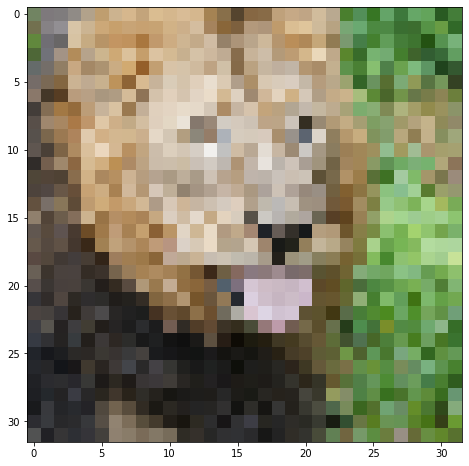

In [86]:
size = 32
train_data, test_data = get_image(size)

Some suggested hyperparameter choices to help you start
- hidden layer count: 4
- hidden layer size: 256
- number of epochs: 1000
- learning reate: 1e-4


#### Low Resolution Reconstruction - SGD - None Mapping

  0%|          | 0/1000 [00:00<?, ?it/s]

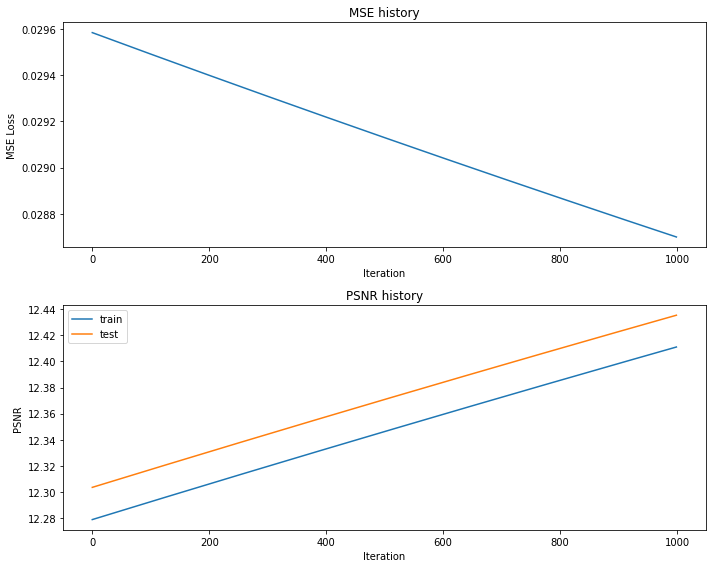

Final Test MSE 0.028539393563159644
Final Test psnr 12.435252638324986


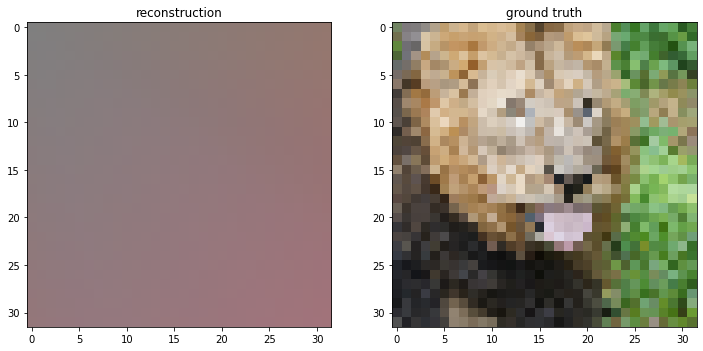

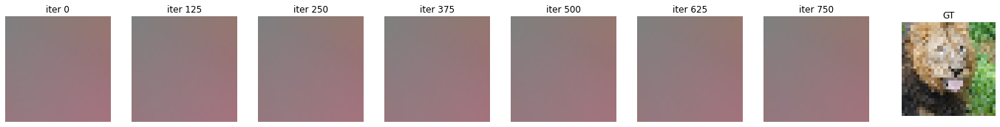

In [94]:
# get input features
# TODO implement this by using the get_B_dict() and get_input_features() helper functions
B_dict = get_B_dict()
#X: (N, D)
#y: (N, C)
#input dimension of N output dimension C. 
output_size = 3

X_train, y_train, X_test, y_test = get_input_features(B_dict, 'none')

learning_rate = 1e-4
epochs = 1000
num_layers = 4
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
input_size = len(X_train[0])

opt = 'SGD'
# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function

net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                  hidden_size, hidden_sizes, output_size, epochs,\
                  learning_rate, opt)
# plot results of experiment

plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)
# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function

#### Low Resolution Reconstruction - SGD - All mappings - Default learning rate

In [95]:
def train_wrapper_sgd(mapping, size, opt,lr):
  # TODO implement
  # makes it easy to run all your mapping experiments in a for loop
  # this will similar to what you did previously in the last two sections

  # run NN experiment on input features
  # TODO implement by using the NN_experiment() helper function
  X_train, y_train, X_test, y_test = get_input_features(B_dict, mapping)
  
  learning_rate =  lr
  epochs = 1000
  num_layers = 4
  hidden_size = 256
  hidden_sizes = [hidden_size] * (num_layers - 1)
  input_size = len(X_train[0])

  opt = opt

  net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                    hidden_size, hidden_sizes, output_size, epochs,\
                    learning_rate, opt)
  
  plot_training_curves(train_loss, train_psnr, test_psnr)
  plot_reconstruction(net.forward(X_test), y_test)
  plot_reconstruction_progress(predicted_images, y_test)
  return {
      'net': net, 
      'train_psnrs': train_psnrs, 
      'test_psnrs': test_psnrs,
      'train_loss': train_loss,
      'pred_imgs': predicted_images
  }



  0%|          | 0/5 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

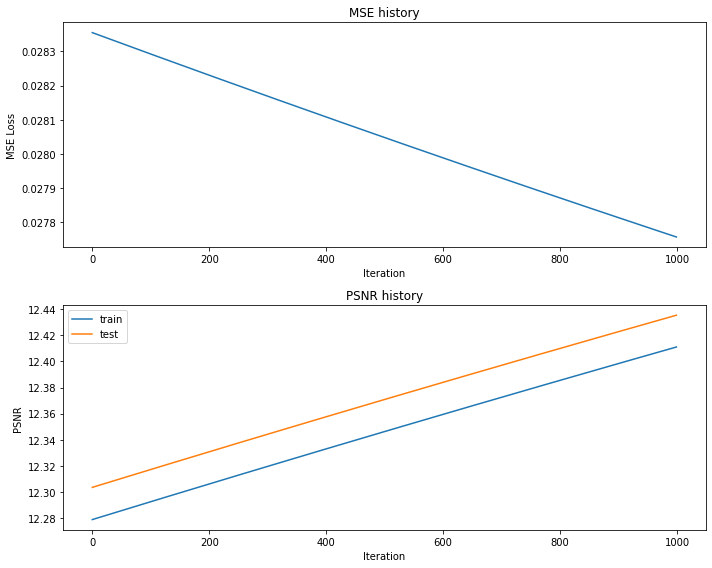

Final Test MSE 0.027574195920808387
Final Test psnr 12.584671473125457


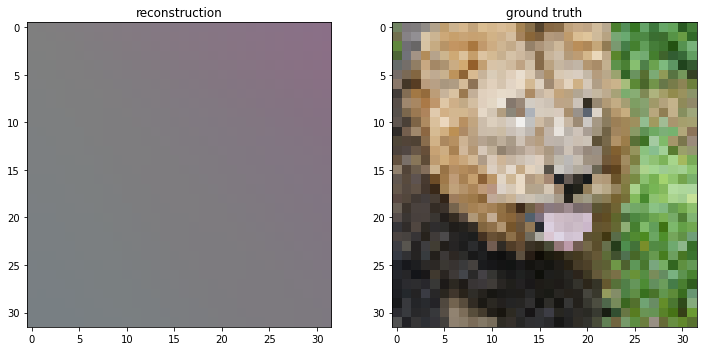

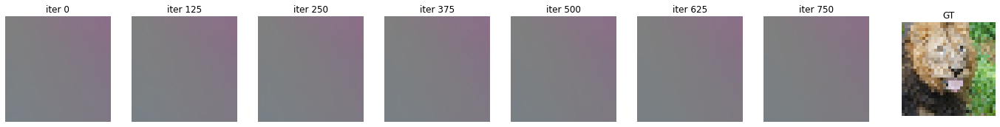

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

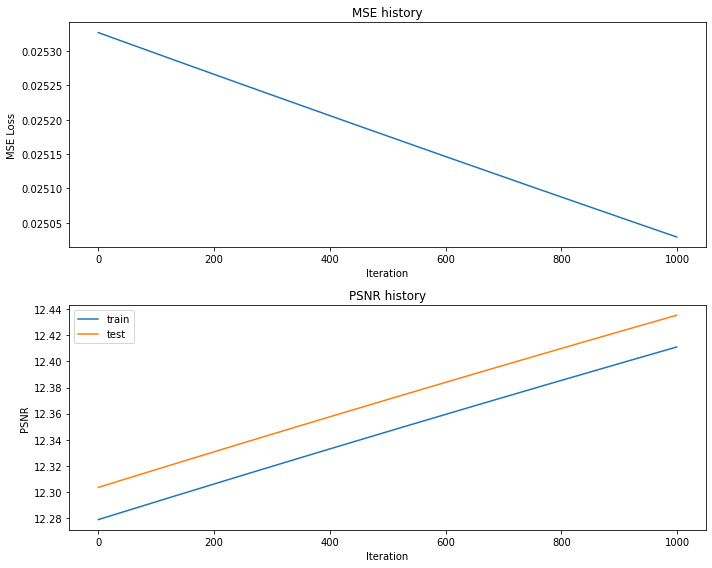

Final Test MSE 0.024707308877730278
Final Test psnr 13.061445597513883


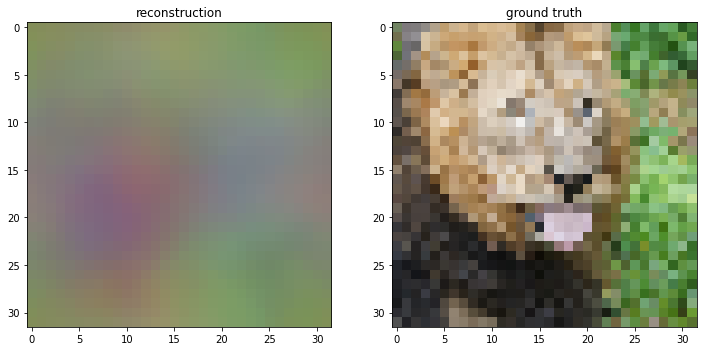

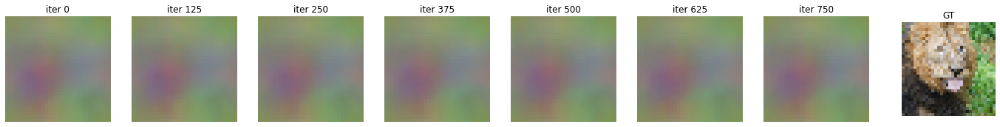

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

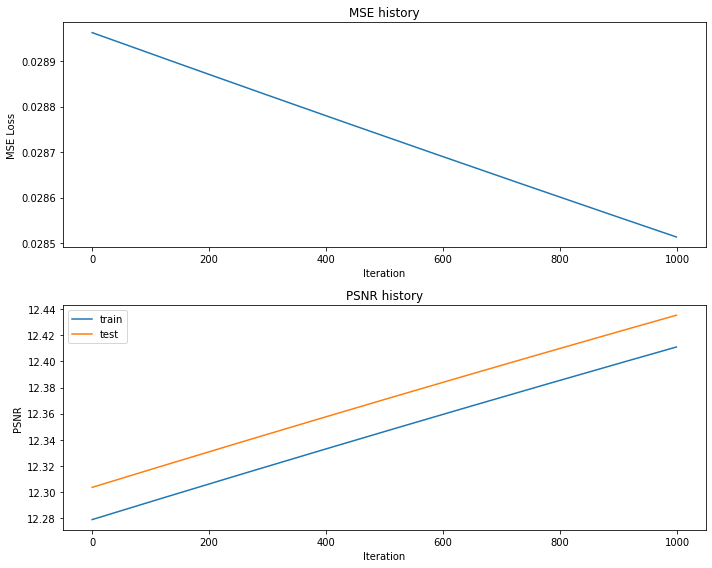

Final Test MSE 0.028211708741553394
Final Test psnr 12.485406128083262


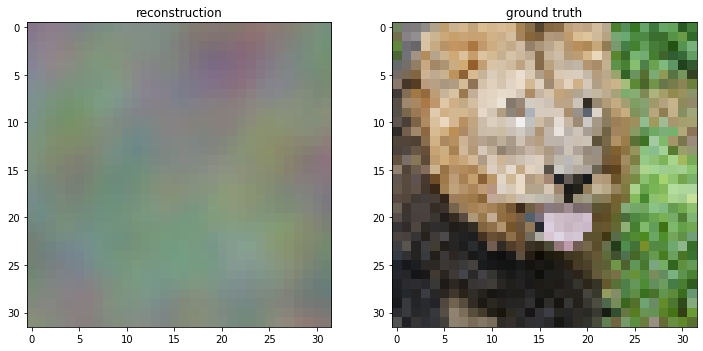

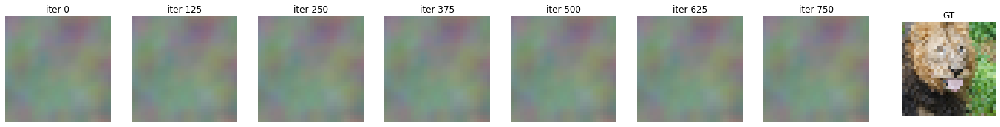

training gauss_10.0


  0%|          | 0/1000 [00:00<?, ?it/s]

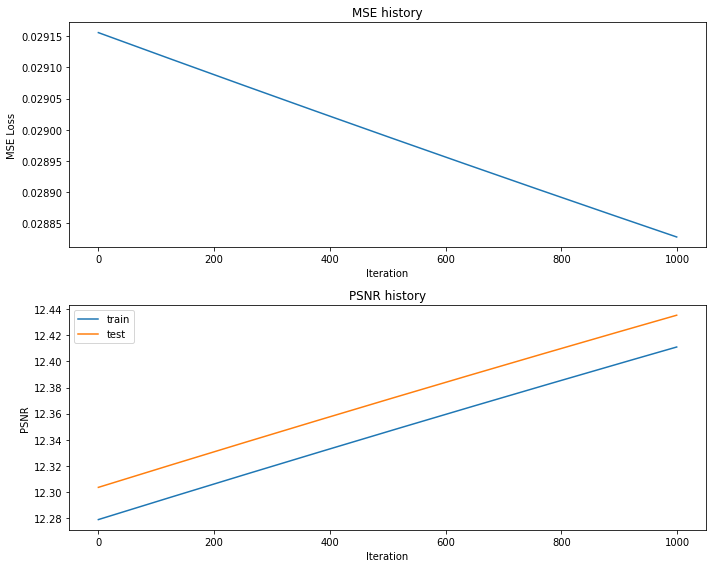

Final Test MSE 0.028910729681744463
Final Test psnr 12.379109513109496


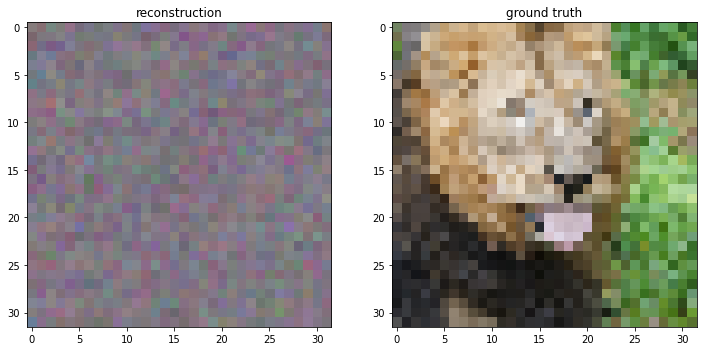

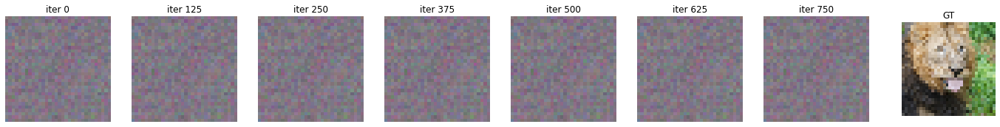

training gauss_100.0


  0%|          | 0/1000 [00:00<?, ?it/s]

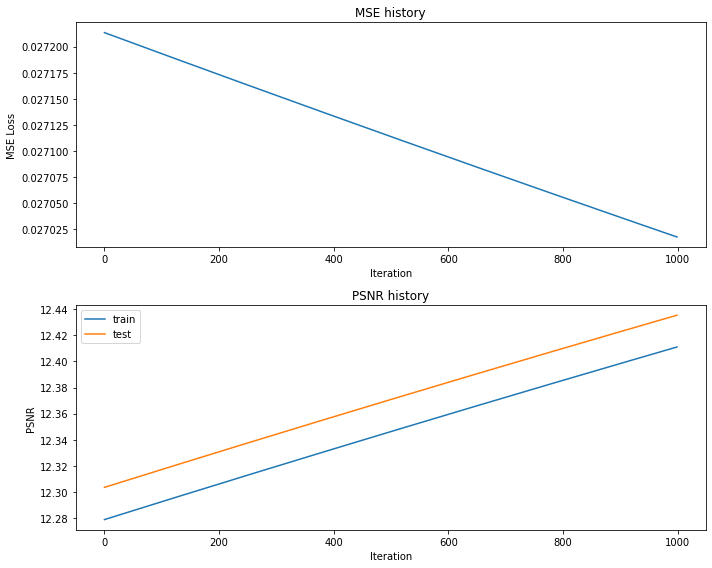

Final Test MSE 0.027349427079781108
Final Test psnr 12.620217712422816


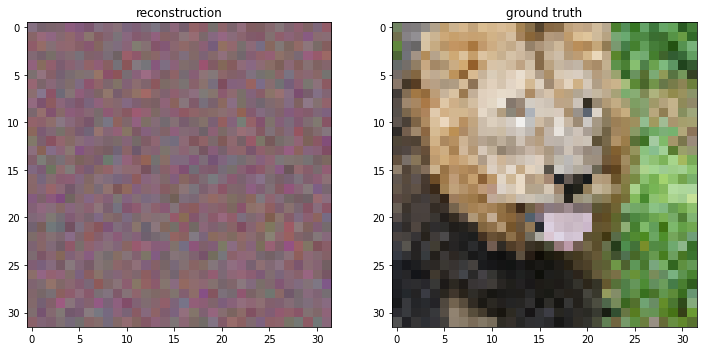

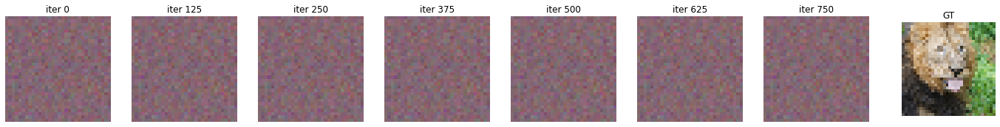

In [96]:
# get input features
outputs = {}
B_dict = get_B_dict()

output_size = 3
lr=1e-4
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper_sgd(k, size, "SGD",lr)


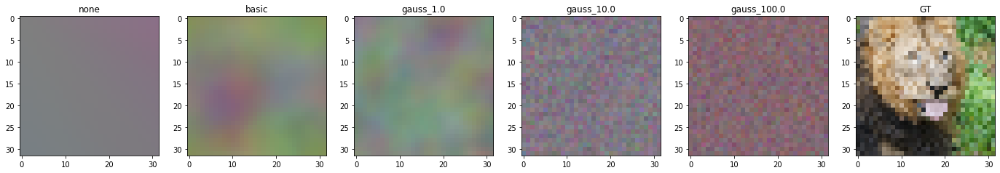

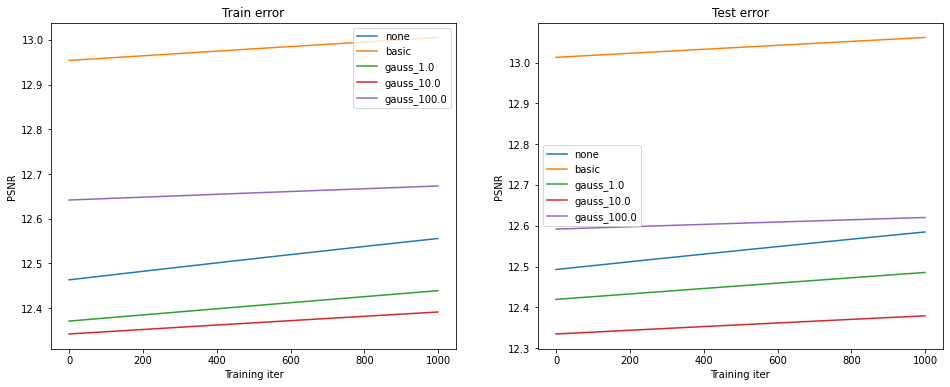

In [97]:
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

#### Low Resolution Reconstruction - SGD - All mappings - Learning rate for optimal results

===============Learning rate 0.5===================


  0%|          | 0/5 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

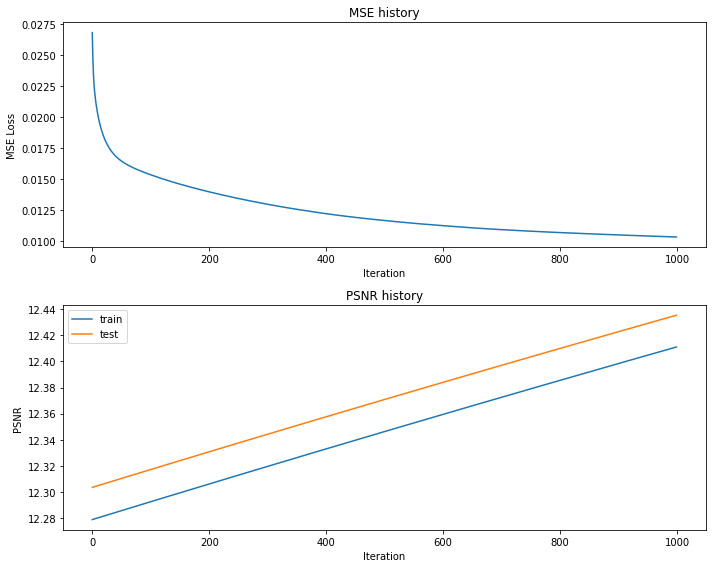

Final Test MSE 0.01007889506605819
Final Test psnr 16.955570806606755


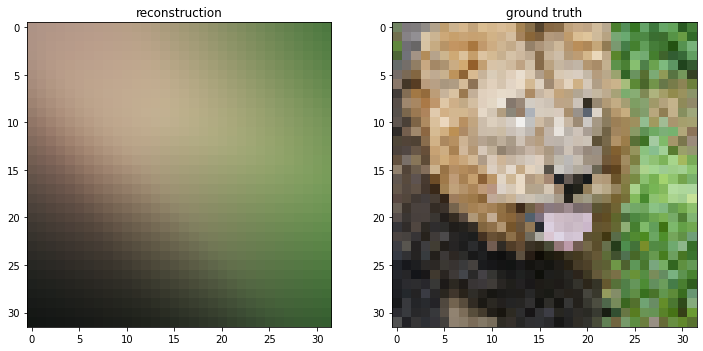

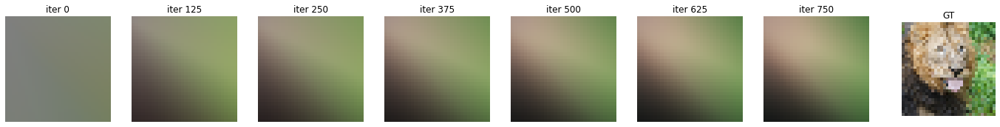

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

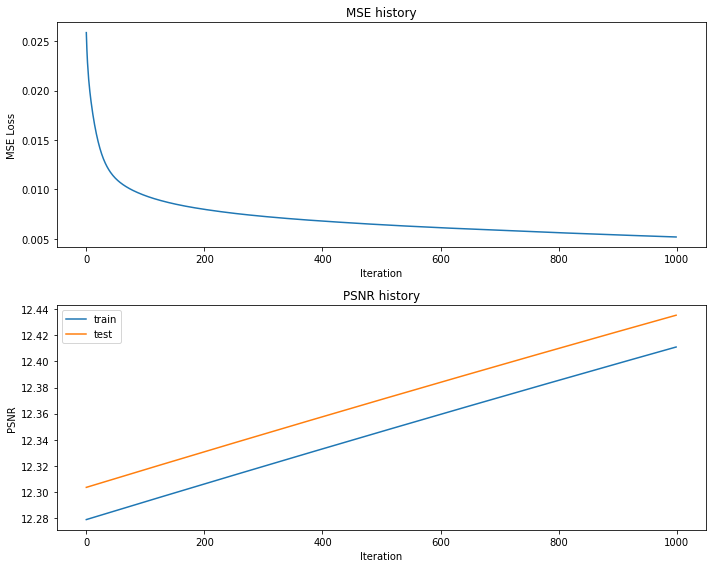

Final Test MSE 0.006440480524724505
Final Test psnr 18.900517330242007


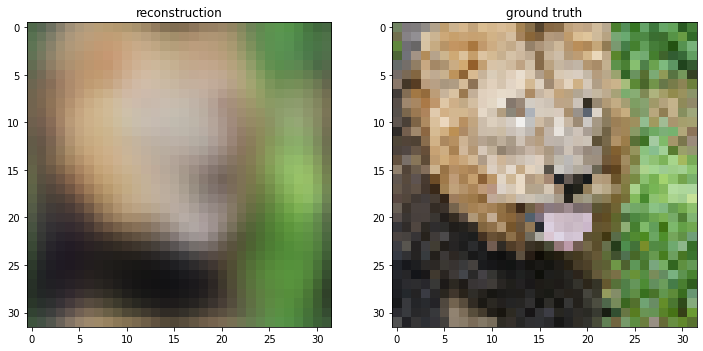

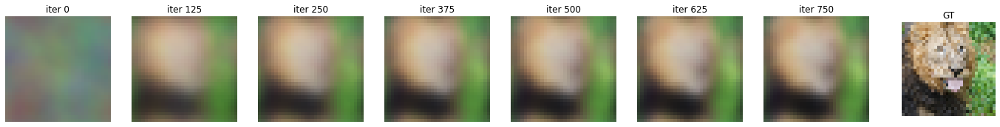

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

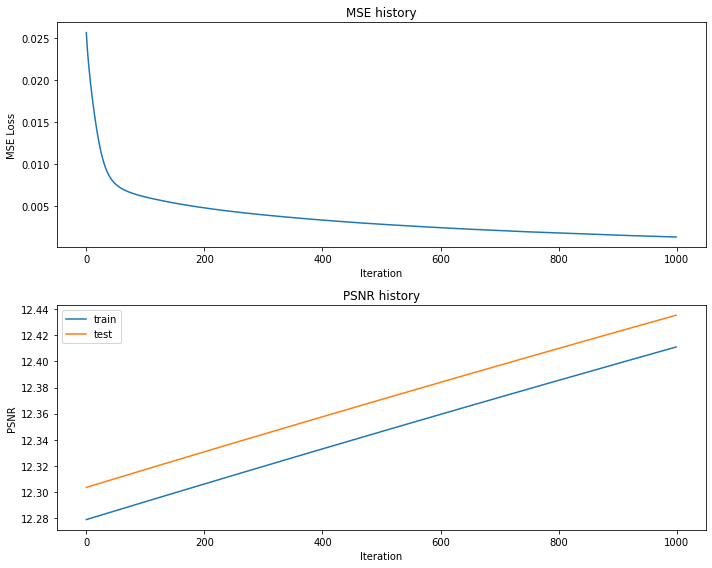

Final Test MSE 0.004966793284338979
Final Test psnr 20.02893919102037


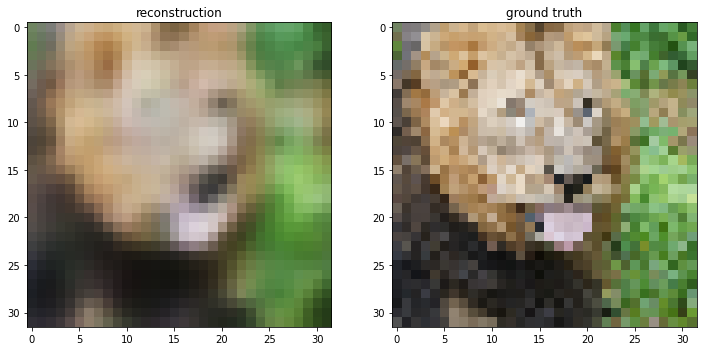

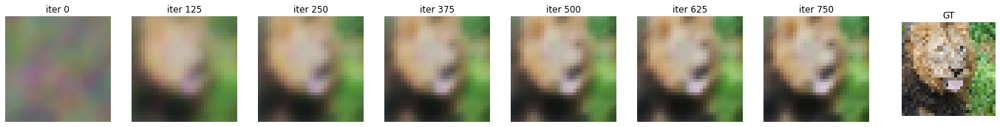

training gauss_10.0


  0%|          | 0/1000 [00:00<?, ?it/s]

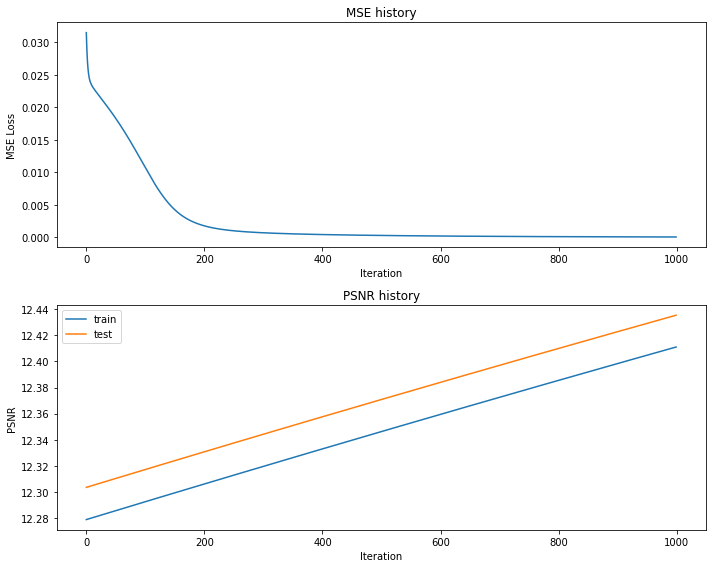

Final Test MSE 0.023805529864764488
Final Test psnr 13.222921518679648


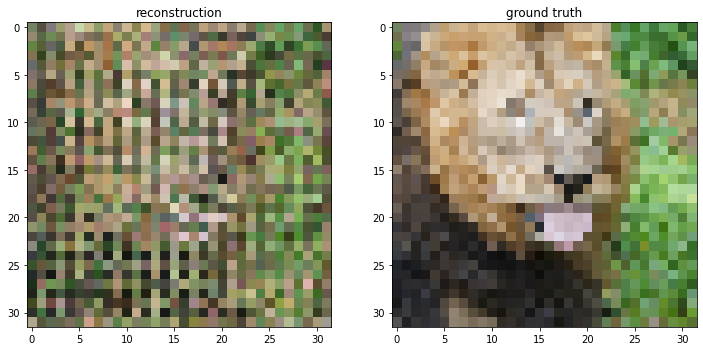

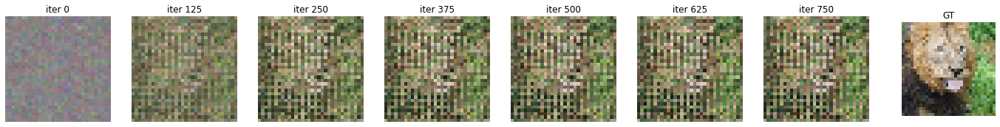

training gauss_100.0


  0%|          | 0/1000 [00:00<?, ?it/s]

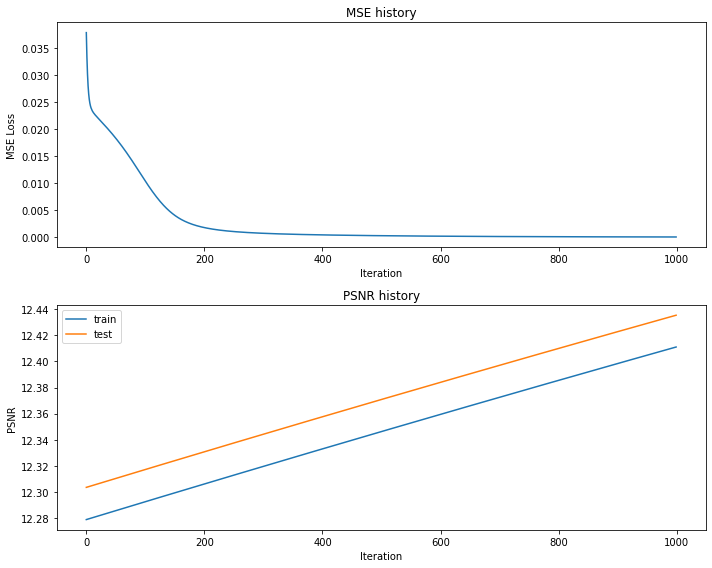

Final Test MSE 0.020496676953136474
Final Test psnr 13.872865480557904


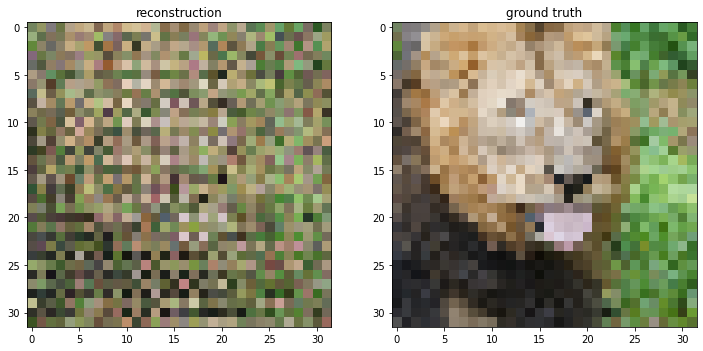

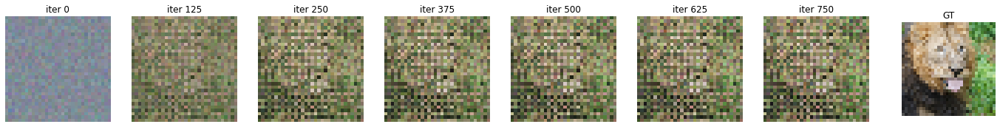

In [98]:
lr=0.5
print("===============Learning rate 0.5===================")
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper_sgd(k, size, "SGD",lr)

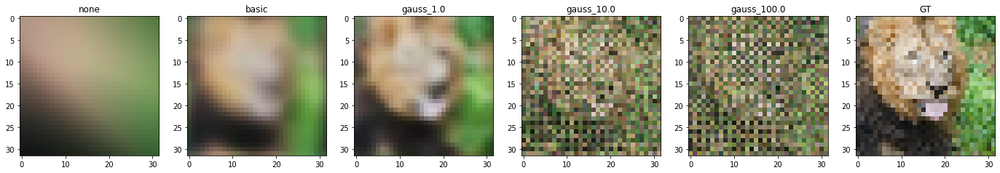

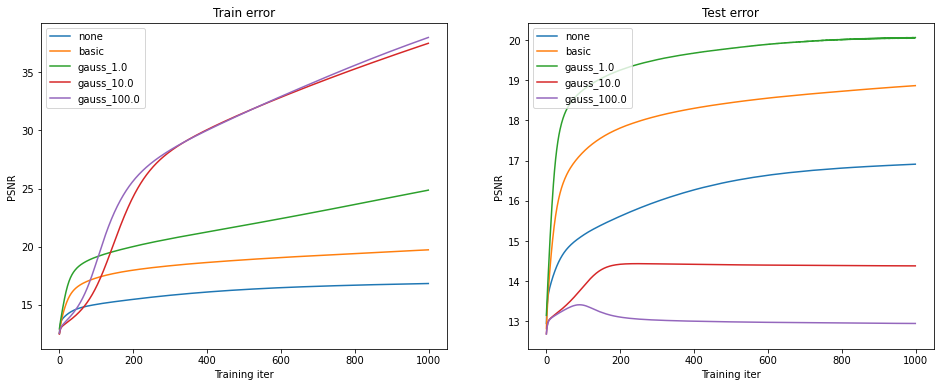

In [62]:
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

#### Low Resolution Reconstruction - Adam - None Mapping

  0%|          | 0/1000 [00:00<?, ?it/s]

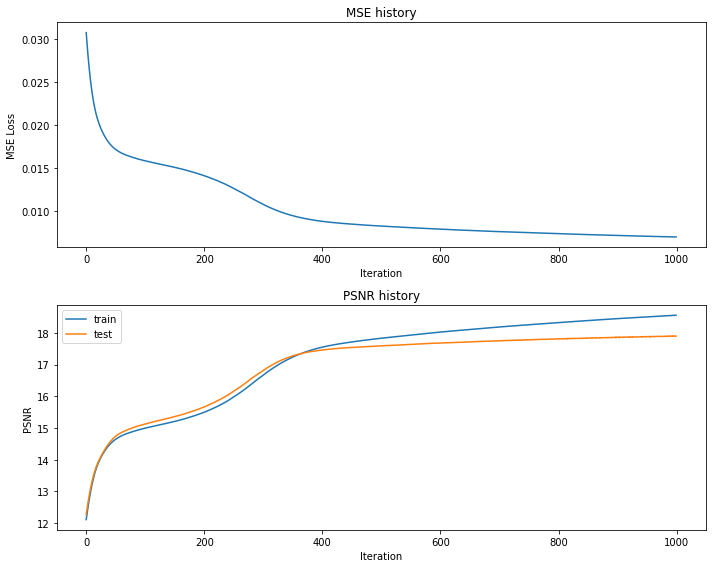

Final Test MSE 0.008116587025355983
Final Test psnr 17.89596554854283


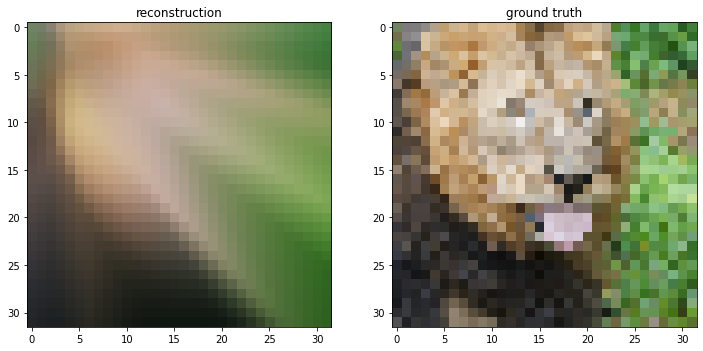

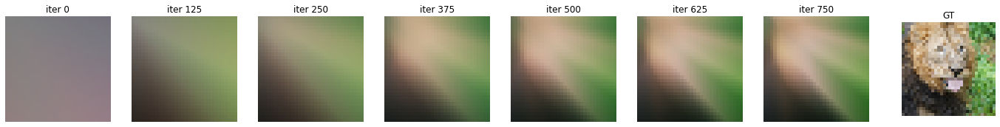

In [63]:
# get input features
# TODO implement this by using the get_B_dict() and get_input_features() helper functions
B_dict = get_B_dict()
#X: (N, D)
#y: (N, C)
#input dimension of N output dimension C. 
output_size = 3
X_train, y_train, X_test, y_test = get_input_features(B_dict, 'none')

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function
learning_rate = 1.0e-4
epochs = 1000
num_layers = 4
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
input_size = len(train_data)

opt = 'Adam'

net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                  hidden_size, hidden_sizes, output_size, epochs,\
                  learning_rate, opt)
# plot results of experiment
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

#### Low Resolution Reconstruction - Optimizer of your Choice - Various Input Mapping Stategies

In [99]:
def train_wrapper(mapping, size, opt):
  # TODO implement
  # makes it easy to run all your mapping experiments in a for loop
  # this will similar to what you did previously in the last two sections
  B_dict = get_B_dict()
  #X: (N, D)
  #y: (N, C)
  #input dimension of N output dimension C. 
  output_size = 3
  
  X_train, y_train, X_test, y_test = get_input_features(B_dict, mapping)

  # run NN experiment on input features
  # TODO implement by using the NN_experiment() helper function
  learning_rate =  1e-4
  epochs = 1000
  num_layers = 4
  hidden_size = 256
  hidden_sizes = [hidden_size] * (num_layers - 1)
  input_size = len(X_train[0])

  opt = opt

  net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                    hidden_size, hidden_sizes, output_size, epochs,\
                    learning_rate, opt)
  
  plot_training_curves(train_loss, train_psnr, test_psnr)

  plot_reconstruction(net.forward(X_test), y_test)
  plot_reconstruction_progress(predicted_images, y_test)
  return {
      'net': net, 
      'train_psnrs': train_psnrs, 
      'test_psnrs': test_psnrs,
      'train_loss': train_loss,
      'pred_imgs': predicted_images
  }



  0%|          | 0/5 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

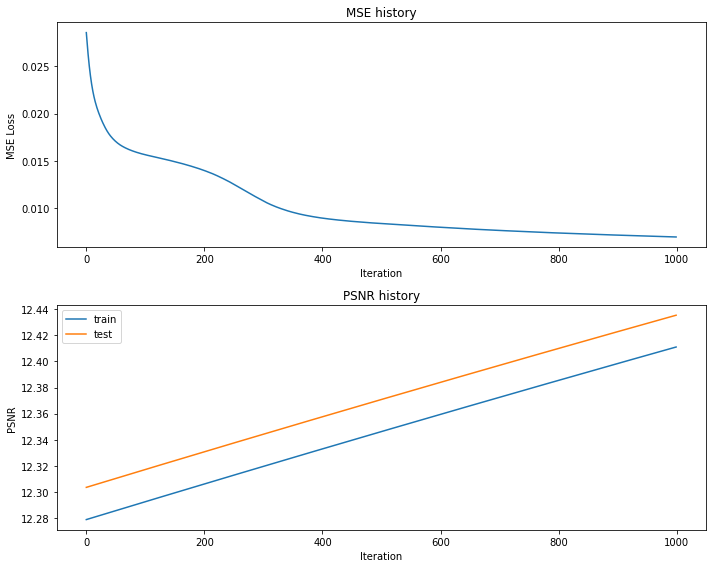

Final Test MSE 0.008109715393668808
Final Test psnr 17.89964391201067


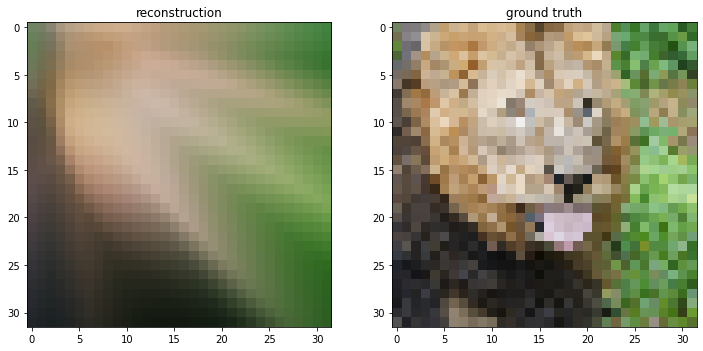

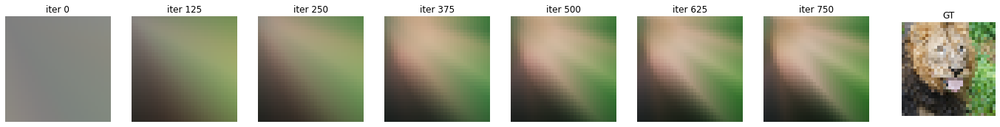

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

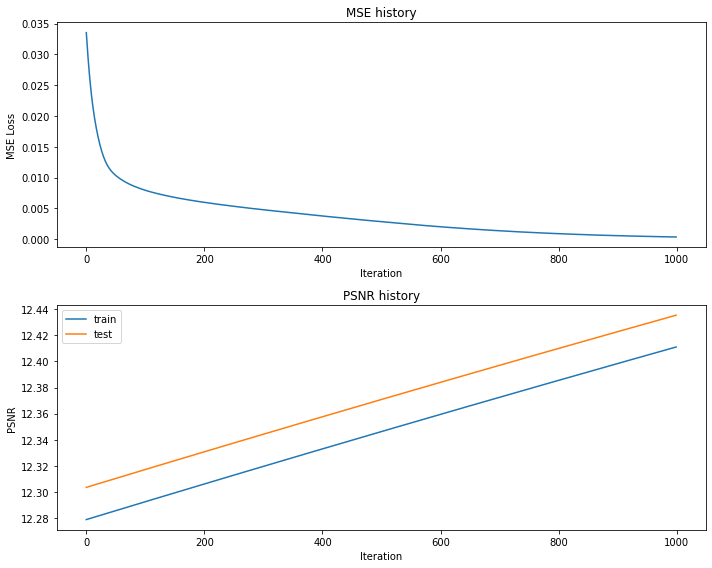

Final Test MSE 0.005350549192255467
Final Test psnr 19.70571643076477


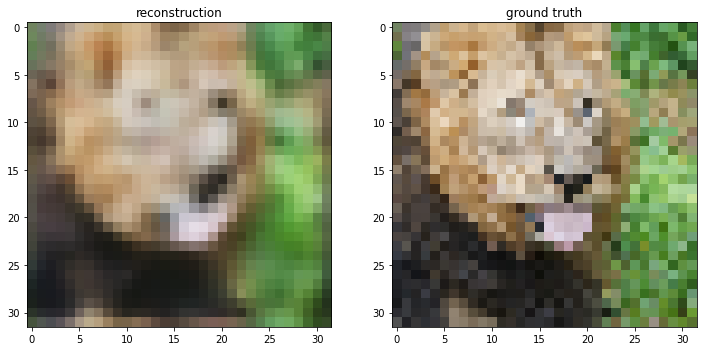

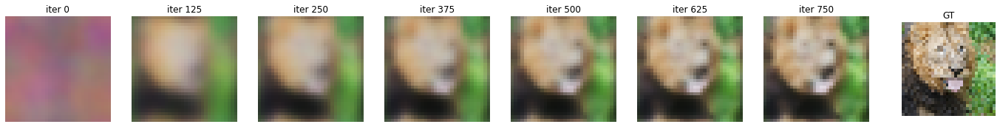

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

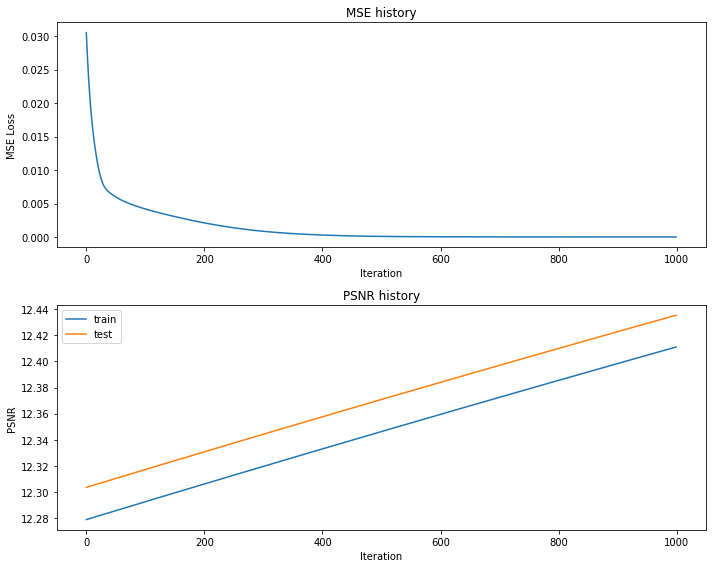

Final Test MSE 0.005278694035104309
Final Test psnr 19.764435142836792


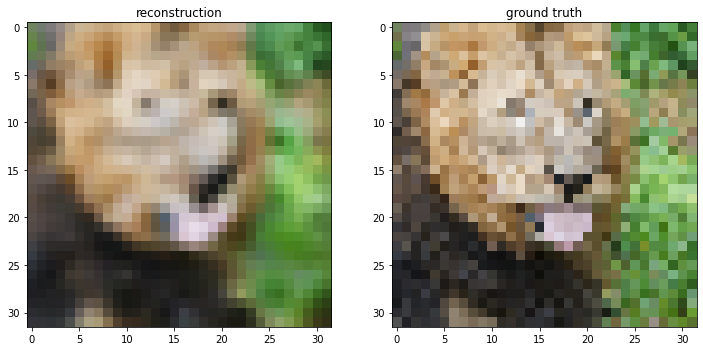

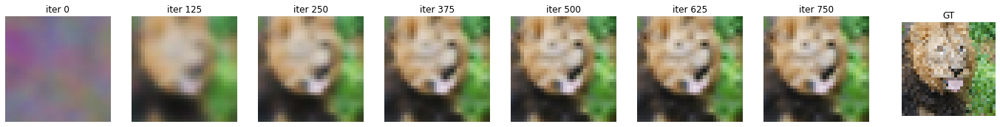

training gauss_10.0


  0%|          | 0/1000 [00:00<?, ?it/s]

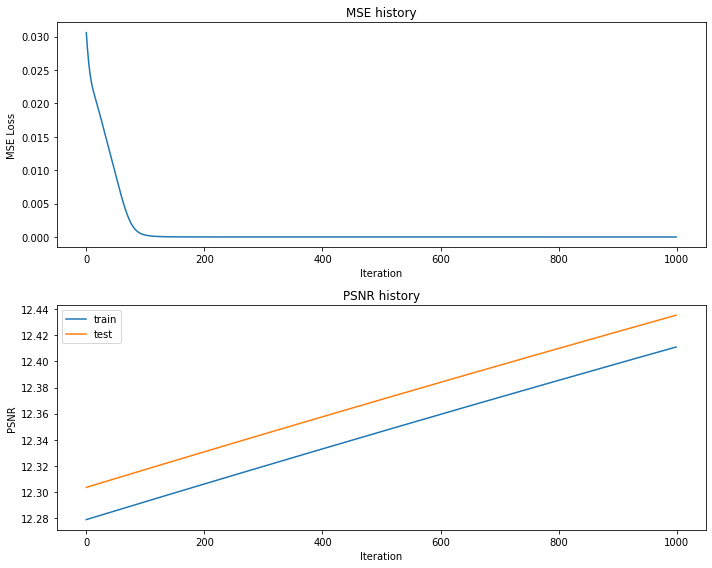

Final Test MSE 0.018756393561747946
Final Test psnr 14.258206674571895


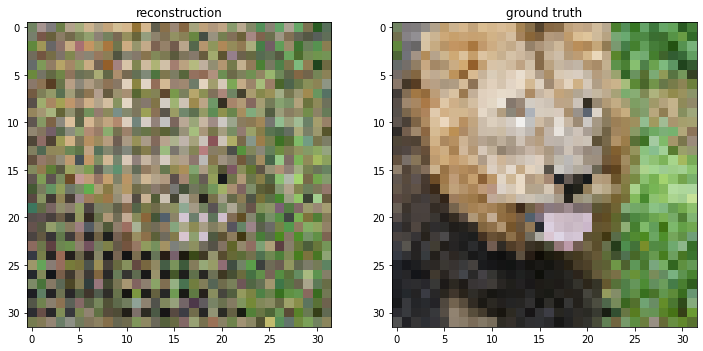

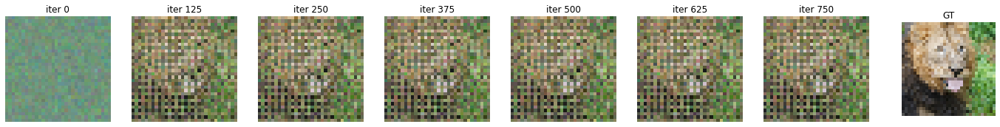

training gauss_100.0


  0%|          | 0/1000 [00:00<?, ?it/s]

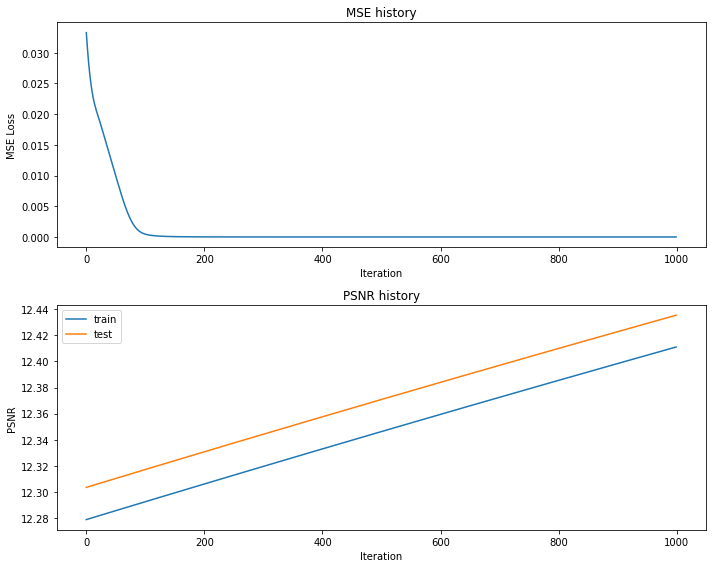

Final Test MSE 0.022198066538335077
Final Test psnr 13.526548554844682


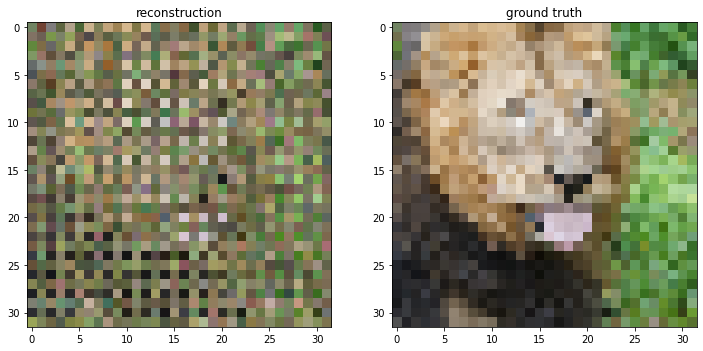

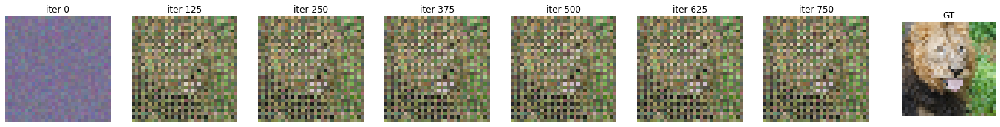

In [100]:
outputs = {}
B_dict = get_B_dict()
output_size = 3
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, "Adam")

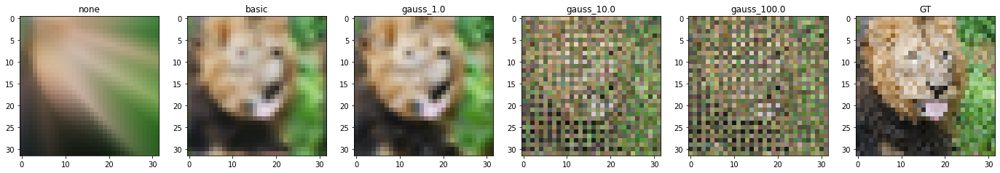

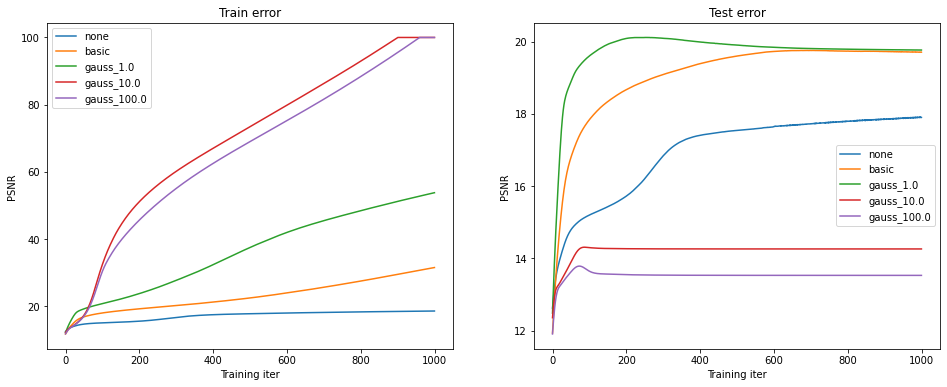

In [101]:
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

# High Resolution Reconstruction

#### High Resolution Reconstruction - Optimizer of your Choice - Various Input Mapping Stategies

Repeat the previous experiment, but at the higher resolution. The reason why we have you first experiment with the lower resolution since it is faster to train and debug. Additionally, you will see how the mapping strategies perform better or worse at the two different input resolutions. 

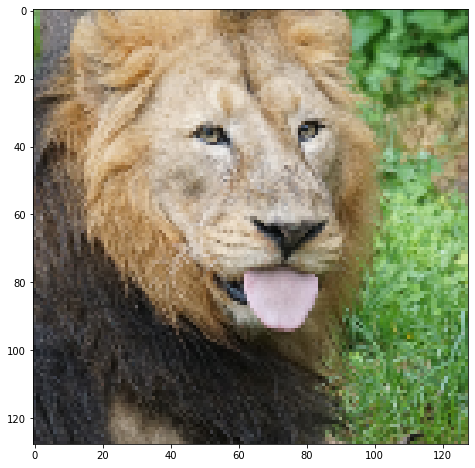

In [80]:
size = 128
train_data, test_data = get_image(size)

  0%|          | 0/5 [00:00<?, ?it/s]

training none


  0%|          | 0/1000 [00:00<?, ?it/s]

Final Test MSE 0.0072427306087348145
Final Test psnr 18.39067672292243


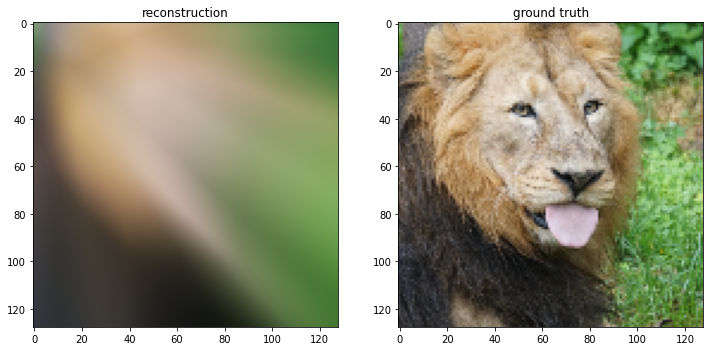

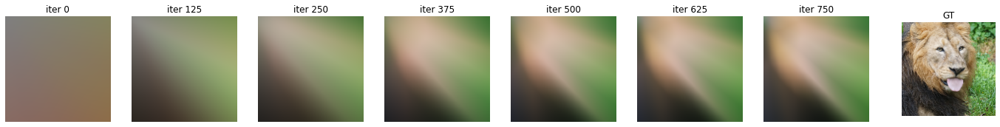

training basic


  0%|          | 0/1000 [00:00<?, ?it/s]

Final Test MSE 0.003787162720368896
Final Test psnr 21.20656038787387


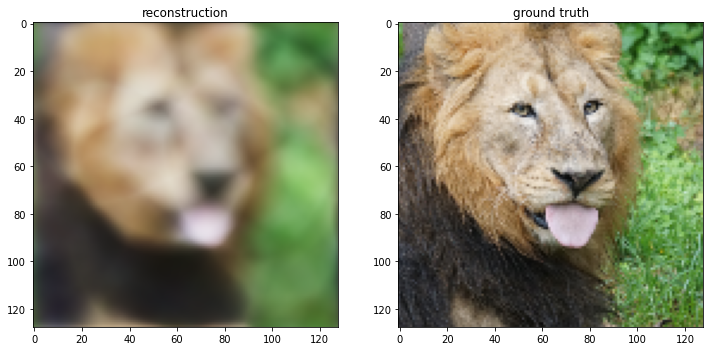

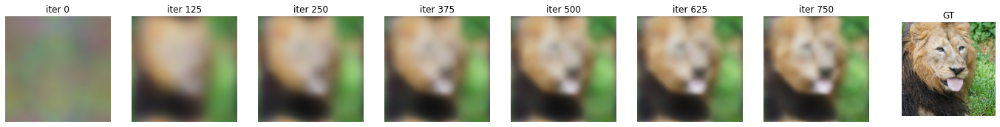

training gauss_1.0


  0%|          | 0/1000 [00:00<?, ?it/s]

Final Test MSE 0.0024752613126997943
Final Test psnr 23.05348950289469


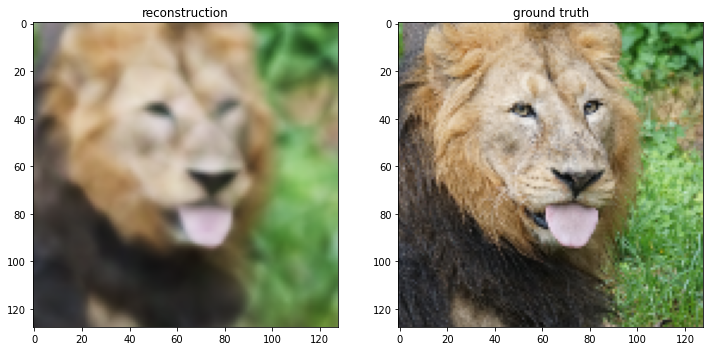

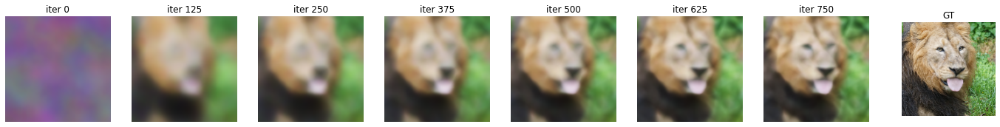

training gauss_10.0


  0%|          | 0/1000 [00:00<?, ?it/s]

Final Test MSE 0.0025490322361351333
Final Test psnr 22.925946765611094


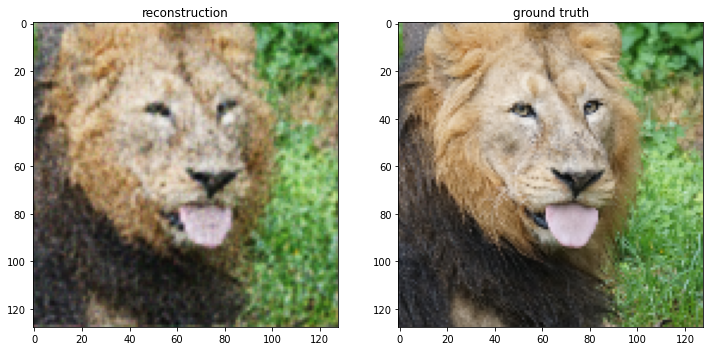

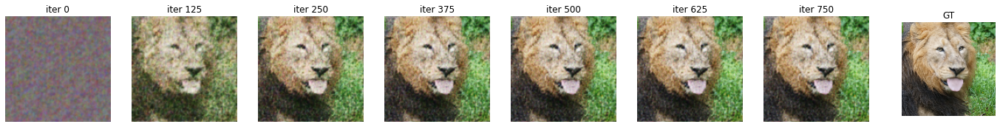

training gauss_100.0


  0%|          | 0/1000 [00:00<?, ?it/s]

Final Test MSE 0.026739221846701827
Final Test psnr 12.718212398768006


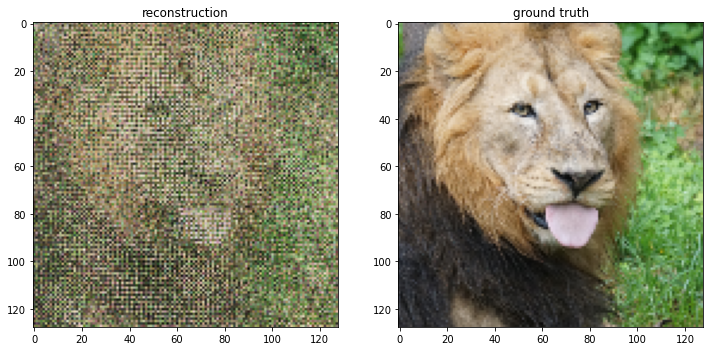

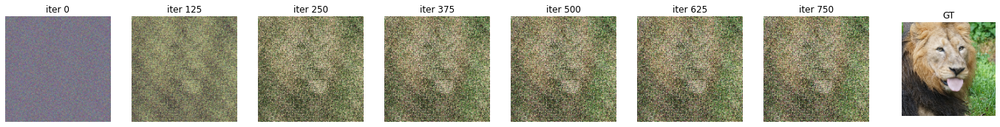

In [81]:
outputs = {}
B_dict = get_B_dict()
output_size = 3
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, size, "Adam")

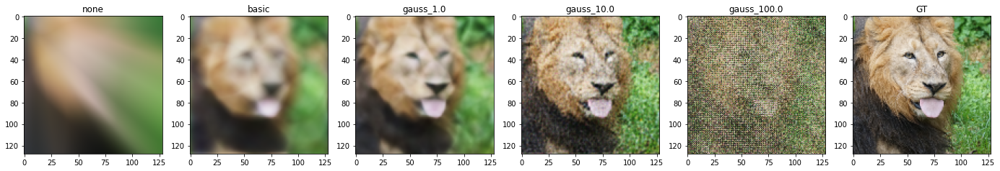

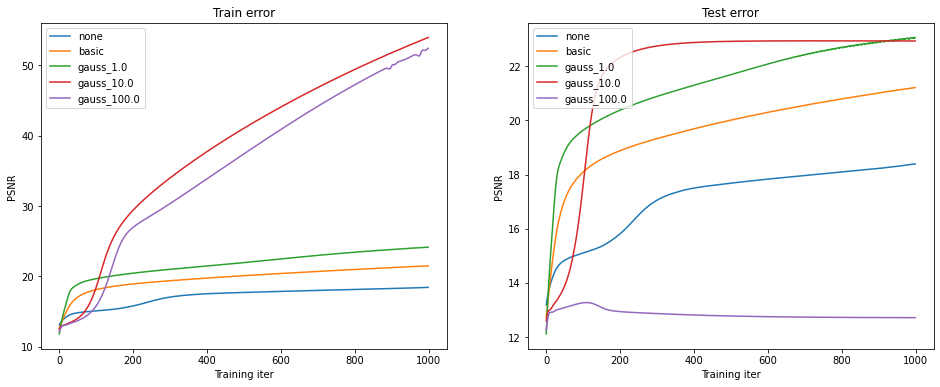

In [83]:
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

The best result is obtained with $\sigma = 10.0$

  0%|          | 0/1000 [00:00<?, ?it/s]

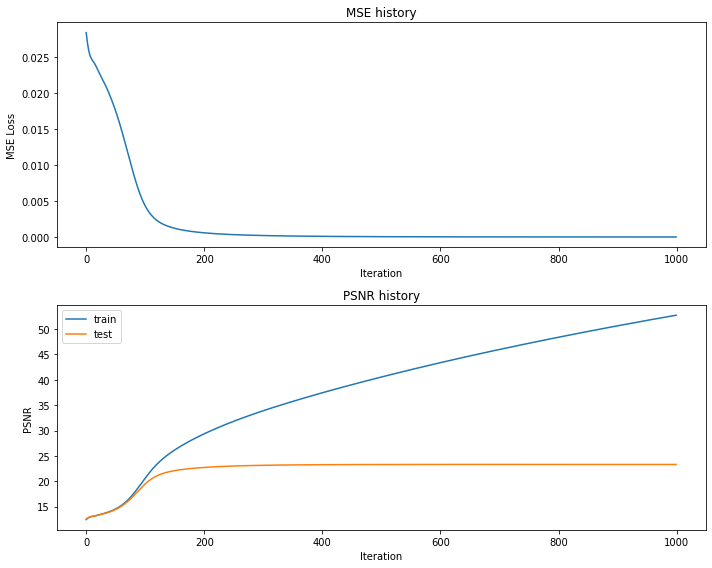

Final Test MSE 0.0023280653834442215
Final Test psnr 23.319748310771175


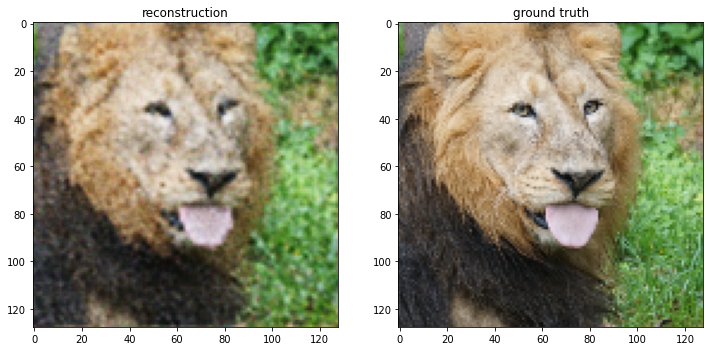

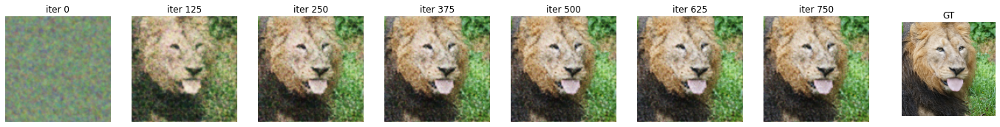

In [68]:
# get input features
# TODO implement this by using the get_B_dict() and get_input_features() helper functions
B_dict = get_B_dict()
#X: (N, D)
#y: (N, C)
#input dimension of N output dimension C. 
output_size = 3
X_train, y_train, X_test, y_test = get_input_features(B_dict, 'gauss_10.0')

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function
learning_rate = 1e-4
epochs = 1000
num_layers = 4
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
input_size = len(X_train[0])

opt = 'Adam'

net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                  hidden_size, hidden_sizes, output_size, epochs,\
                  learning_rate, opt)
# plot results of experiment
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

#### High Resolution Reconstruction - Image of your Choice

When choosing an image select one that you think will give you interesting results or a better insight into the performance of different feature mappings and explain why in your report template. 

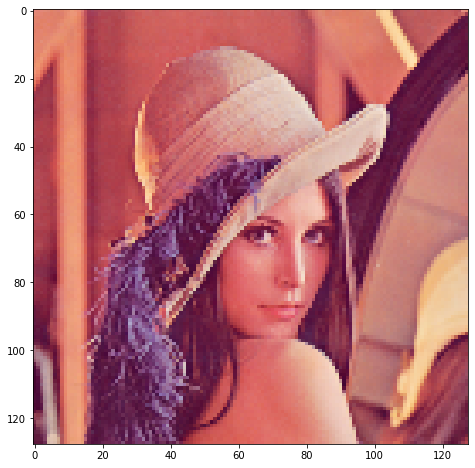

In [76]:
size = 128
# TODO pick an image and replace the url string
img = imageio.imread("Lenna_(test_image).png")[..., :3] / 255.
c = [img.shape[0]//2, img.shape[1]//2]
r = 256
img = img[c[0]-r:c[0]+r, c[1]-r:c[1]+r]

if size != 512:
  img = cv2.resize(img, (size, size))

plt.imshow(img)
plt.show()

# Create input pixel coordinates in the unit square
coords = np.linspace(0, 1, img.shape[0], endpoint=False)
x_test = np.stack(np.meshgrid(coords, coords), -1)
test_data = [x_test, img]
train_data = [x_test[::2, ::2], img[::2, ::2]]



  0%|          | 0/1000 [00:00<?, ?it/s]

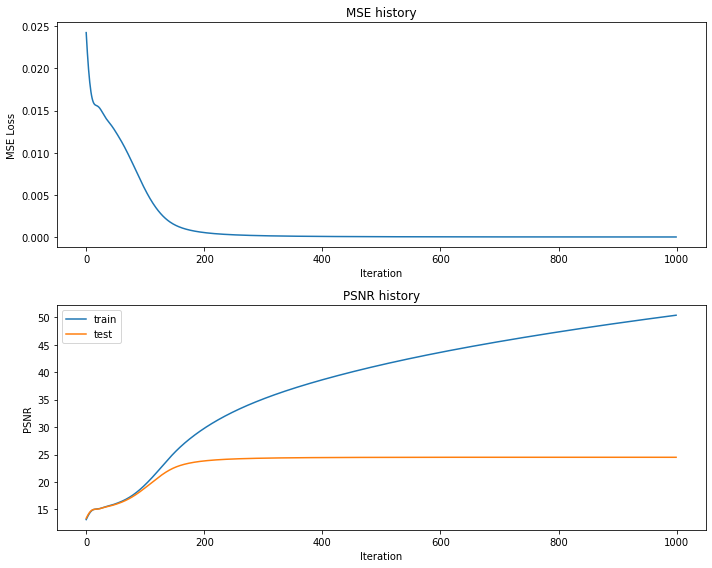

Final Test MSE 0.0017756212278054382
Final Test psnr 24.496196758990806


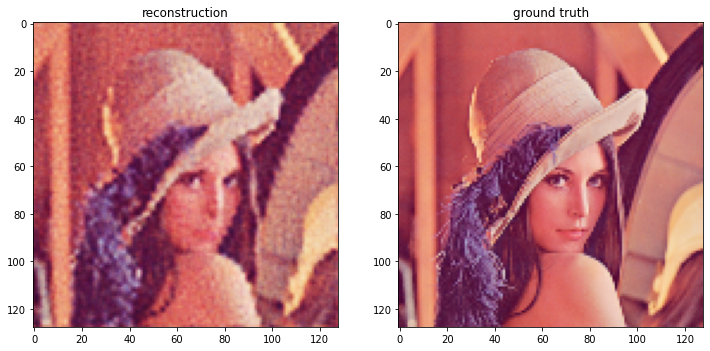

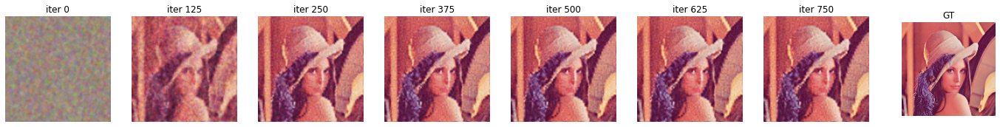

In [77]:
# get input features
# TODO implement this by using the get_B_dict() and get_input_features() helper functions

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function
# TODO implement this by using the get_B_dict() and get_input_features() helper functions
B_dict = get_B_dict()
#X: (N, D)
#y: (N, C)
#input dimension of N output dimension C. 
output_size = 3
X_train, y_train, X_test, y_test = get_input_features(B_dict, 'gauss_10.0')

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function
learning_rate = 1.0e-4
epochs = 1000
num_layers = 4
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
input_size = len(X_train[0])

opt = 'Adam'

net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                  hidden_size, hidden_sizes, output_size, epochs,\
                  learning_rate, opt)
# plot results of experiment

plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

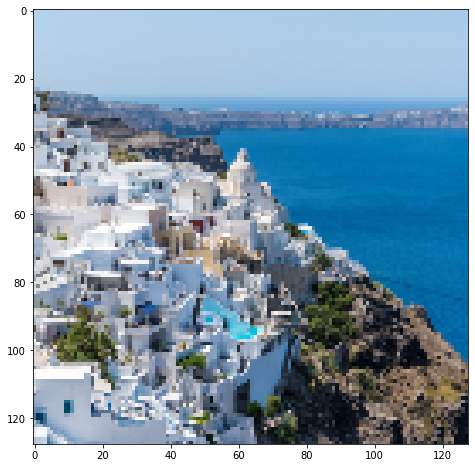

In [85]:
size = 128
# TODO pick an image and replace the url string
img = imageio.imread("https://bmild.github.io/fourfeat/img/greece_orig.png")[..., :3] / 255.
c = [img.shape[0]//2, img.shape[1]//2]
r = 256
img = img[c[0]-r:c[0]+r, c[1]-r:c[1]+r]

if size != 512:
  img = cv2.resize(img, (size, size))

plt.imshow(img)
plt.show()

# Create input pixel coordinates in the unit square
coords = np.linspace(0, 1, img.shape[0], endpoint=False)
x_test = np.stack(np.meshgrid(coords, coords), -1)
test_data = [x_test, img]
train_data = [x_test[::2, ::2], img[::2, ::2]]



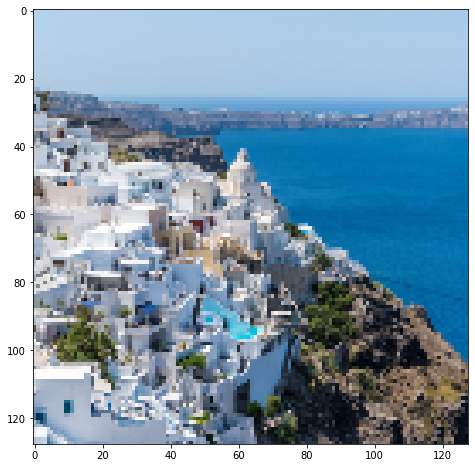

  0%|          | 0/1000 [00:00<?, ?it/s]

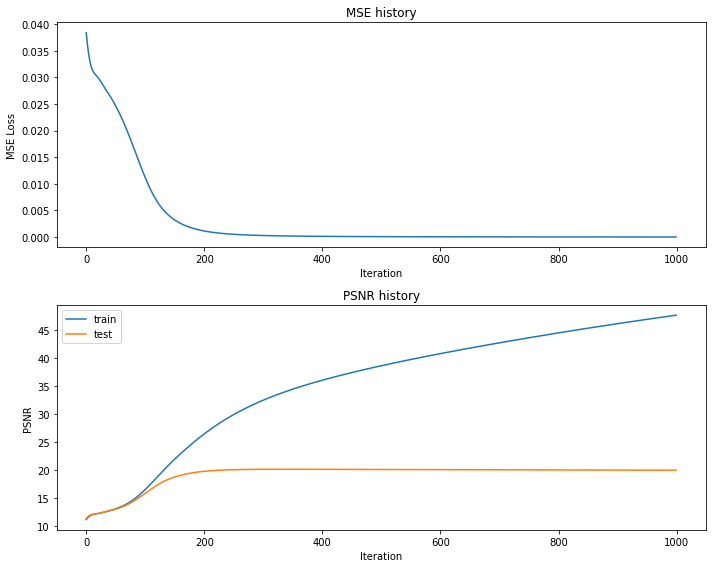

Final Test MSE 0.00503794765742921
Final Test psnr 19.96716353323141


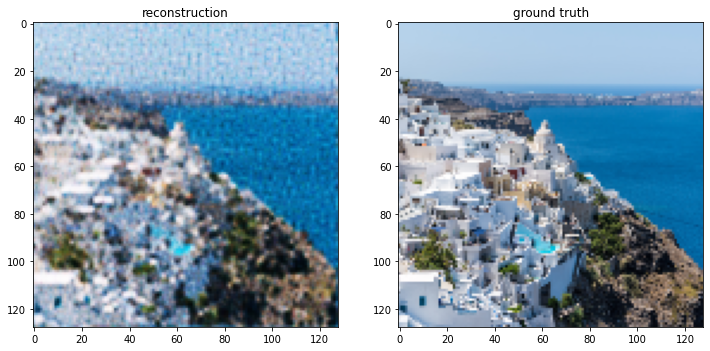

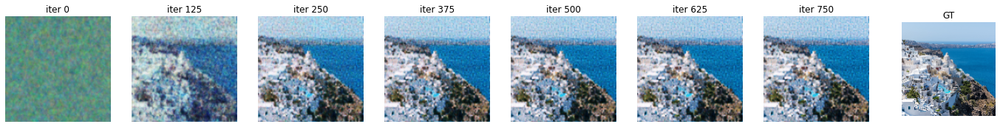

In [79]:

size = 128
# TODO pick an image and replace the url string
img = imageio.imread("https://bmild.github.io/fourfeat/img/greece_orig.png")[..., :3] / 255.
c = [img.shape[0]//2, img.shape[1]//2]
r = 256
img = img[c[0]-r:c[0]+r, c[1]-r:c[1]+r]

if size != 512:
  img = cv2.resize(img, (size, size))

plt.imshow(img)
plt.show()

# Create input pixel coordinates in the unit square
coords = np.linspace(0, 1, img.shape[0], endpoint=False)
x_test = np.stack(np.meshgrid(coords, coords), -1)
test_data = [x_test, img]
train_data = [x_test[::2, ::2], img[::2, ::2]]

# get input features
# TODO implement this by using the get_B_dict() and get_input_features() helper functions

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function
# TODO implement this by using the get_B_dict() and get_input_features() helper functions
B_dict = get_B_dict()
#X: (N, D)
#y: (N, C)
#input dimension of N output dimension C. 
output_size = 3
X_train, y_train, X_test, y_test = get_input_features(B_dict, 'gauss_10.0')

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function
learning_rate=1e-4
epochs = 1000
num_layers = 4
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
input_size = len(X_train[0])

opt = 'Adam'

net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                  hidden_size, hidden_sizes, output_size, epochs,\
                  learning_rate, opt)
# plot results of experiment

plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

# Reconstruction Process Video (Optional)
(For Fun!) Visualize the progress of training in a video 

In [ ]:
# requires installing this additional dependency
!pip install imageio-ffmpeg

In [ ]:
# single video example
create_and_visualize_video({"gauss": {"pred_imgs": predicted_images}}, filename="training_high_res_gauss.mp4")

In [ ]:
# multi video example
create_and_visualize_video(outputs, epochs=1000, size=32)

In [102]:
%%capture
# Here we use a script to generate pdf and save it to google drive.

# After executing this cell, you will be asked to link to your GoogleDrive account. 
# Then, the pdf will be generated and saved to your GoogleDrive account and you need to go there to download;
#/content/drive/MyDrive/Colab Notebooks/CS 444 Assignment-1.ipynb /content/drive/MyDrive/Colab Notebooks/CS443RL_Assignment2_FengZ.ipynb
from google.colab import drive
drive.mount('/content/drive')
! apt-get install texlive-xetex